In [1]:
import pandas as pd
import geopandas as gpd

In [3]:
# Data scraped from: 'https://bradforddistrictparks.org/park/page/'
bd_parks= gpd.read_file('bradford_dsitrict_parks.geojson')

In [4]:
bd_parks

,Park Name,Park URL,Location,Opening Hours,Latitude,Longitude,Car parking,River,Walking routes,Cycle route,...,Bandstand,Play area for ages 0-3,Aviary,Sensory garden,Glass house,Museum,Boating lake,Miniature railway,Park features str,geometry
0,Hirst Woods,https://bradforddistrictparks.org/park/hirst-w...,"Hirst Lane, Shipley BD18 4NQ","Open 24 hours a day, all year round",53.8386042,-1.7997105,1,1,1,0,...,0,0,0,0,0,0,0,0,"Car parking, River, Walking routes",POINT (-1.79971 53.83860)
1,Hebers Ghyll Woodlands,https://bradforddistrictparks.org/park/hebers-...,"Heber’s Ghyll Drive, Ilkley, LS29 9QG","Open 24 hours a day, all year round",53.9223767,-1.8472706,0,1,1,0,...,0,0,0,0,0,0,0,0,"River, Walking routes",POINT (-1.84727 53.92238)
2,Esholt Woods,https://bradforddistrictparks.org/park/esholt-...,High View/ Station Road BD17 7QT and Springs R...,"Open 24 hours a day, all year round",53.8600579,-1.7258293,0,0,1,1,...,0,0,0,0,0,0,0,0,"Cycle route, Walking routes",POINT (-1.72583 53.86006)
3,Chellow Dean Woods,https://bradforddistrictparks.org/park/chellow...,"Haworth Road, Allerton Bd15 9LL","Open 24 hours a day, all year round",53.8147763,-1.8292597,1,0,1,0,...,0,0,0,0,0,0,0,0,"Accessibility route, Car parking, Pond, Walkin...",POINT (-1.82926 53.81478)
4,Black Carr Woods,https://bradforddistrictparks.org/park/black-c...,"Ned Lane, Tyersal Gate, BD4 0EQ","Open 24 hours a day, all year round",53.7808651,-1.7015763,0,0,0,0,...,0,0,0,0,0,0,0,0,"Open 24 hours a day, all year round",POINT (-1.70158 53.78087)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,Lister Park,https://bradforddistrictparks.org/park/lister-...,"North Park Road, Bradford, BD9 4NS","Open 24 hours a day, all year round",53.813188,-1.7721311999999898,1,0,1,0,...,1,0,0,0,0,1,1,0,"Bandstand, Boating lake, Café, Car parking, Fi...",POINT (-1.77213 53.81319)
67,Middleton Woods,https://bradforddistrictparks.org/park/middlet...,"Denton Road, LS29 8EW","Open 24 hours a day, all year round",53.934798993183,-1.7972921622379,0,0,1,0,...,0,0,0,0,0,0,0,0,"Nature reserve, Walking routes, Wildflower area",POINT (-1.79729 53.93480)
68,Northcliffe Park,https://bradforddistrictparks.org/park/northcl...,"Bradford Road, BD18 3BX","Open 24 hours a day, all year round",53.8274937,-1.7826430000000073,0,0,1,0,...,0,0,0,0,0,0,0,1,"Bowling green, Childrens play area, Fitness eq...",POINT (-1.78264 53.82749)
69,Bradford Moor Park,https://bradforddistrictparks.org/park/bradfor...,"Killinghall Road, BD3 7JD","Open 24 hours a day, all year round",53.7998973,-1.719939,0,0,1,0,...,0,1,0,0,0,0,0,0,"5-a-side football pitch, Basketball court, Bow...",POINT (-1.71994 53.79990)


/var/folders/78/m__nl8h97l7358p69kgvvz_c0000gp/T/ipykernel_11652/31652018.py:14: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf = ox.geometries_from_place(place_name, tags)


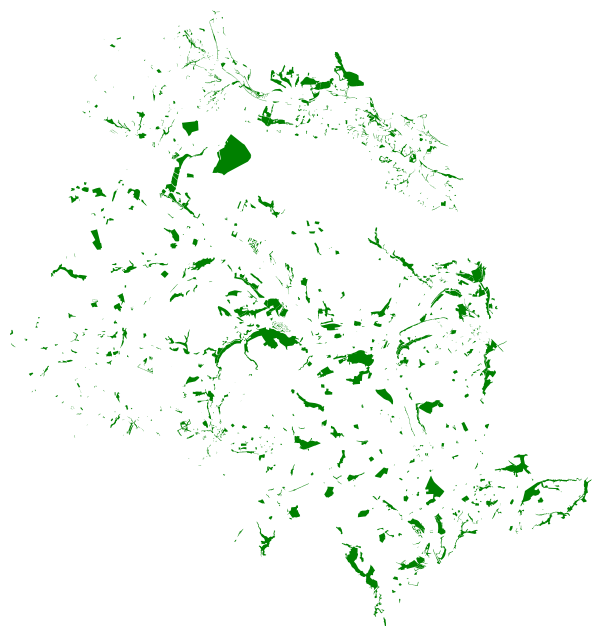

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [59]:
import osmnx as ox

# Define the place name
place_name = "Bradford, West Yorkshire, England"

# Define the tags for parks, woodlands, and scrublands
tags = {
    'leisure': ['park'],
    #'landuse': ['forest', 'meadow'],
    'natural': ['wood', 'scrub']
}

# Get the geometries for the specified tags
gdf = ox.geometries_from_place(place_name, tags)

# # Filter the geometries to include only parks, woodlands, and scrublands
# parks_woods_scrublands = gdf[gdf['leisure'].isin(['park']) | 
#                              gdf['landuse'].isin(['forest', 'meadow']) | 
#                              gdf['natural'].isin(['wood', 'scrub'])]

parks= gdf[gdf['leisure'].isin(['park'])|
                             #gdf['landuse'].isin(['forest', 'meadow']) | 
                             gdf['natural'].isin(['wood', 'scrub'])]

# Plot the geometries
ox.plot_footprints(parks, bgcolor='white', color='green')

# Save the geometries to a GeoJSON file
#parks_woods_scrublands.to_file("parks_woods_scrublands_bradford.geojson", driver="GeoJSON")


In [60]:
parks.explore()

In [61]:
parks.columns

Index(['access', 'geometry', 'created_by', 'description', 'leisure', 'name',
       'source', 'addr:city', 'addr:housenumber', 'addr:postcode',
       'addr:street', 'operator', 'note', 'natural', 'nodes',
       'name:pronunciation', 'wikidata', 'wikipedia', 'landuse', 'old_name',
       'source:old_name', 'source:name', 'leaf_type', 'disused:amenity',
       'website', 'surface', 'leaf_cycle', 'note:landuse', 'designation',
       'alt_name', 'source:alt_name', 'landcover', 'farmland',
       'addr:housename', 'addr:village', 'opening_hours', 'source:geometry',
       'fixme', 'ways', 'type'],
      dtype='object')

In [62]:
parks =parks.reset_index()

In [63]:
parks.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1653 entries, 0 to 1652
Data columns (total 42 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   element_type        1653 non-null   object  
 1   osmid               1653 non-null   int64   
 2   access              4 non-null      object  
 3   geometry            1653 non-null   geometry
 4   created_by          1 non-null      object  
 5   description         9 non-null      object  
 6   leisure             247 non-null    object  
 7   name                279 non-null    object  
 8   source              729 non-null    object  
 9   addr:city           2 non-null      object  
 10  addr:housenumber    1 non-null      object  
 11  addr:postcode       1 non-null      object  
 12  addr:street         1 non-null      object  
 13  operator            2 non-null      object  
 14  note                14 non-null     object  
 15  natural             1408 non-n

In [64]:
parks.loc[~parks['access'].isnull(),:]

,element_type,osmid,access,geometry,created_by,description,leisure,name,source,addr:city,...,source:alt_name,landcover,farmland,addr:housename,addr:village,opening_hours,source:geometry,fixme,ways,type
45,way,35097694,private,"POLYGON ((-1.89675 53.91663, -1.90108 53.91588...",NaN,Actively forested area. Private but with cross...,NaN,White Crag Plantation,NPE,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
377,way,196259066,yes,"POLYGON ((-1.86380 53.93844, -1.86360 53.93841...",NaN,NaN,park,NaN,Bing,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
475,way,238501211,yes,"POLYGON ((-1.87399 53.94370, -1.87376 53.94417...",NaN,NaN,park,Church Orchard,Bing;survey,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1005,way,815713937,private,"POLYGON ((-1.86273 53.94062, -1.86267 53.94067...",NaN,park for residents only,park,NaN,survey,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [65]:

m= parks.explore(color="green")

bd_parks.explore(m=m, color="red")

m

In [66]:
temp =bd_parks.to_crs(epsg='27700').sjoin_nearest(parks.to_crs(epsg='27700'), how="left",max_distance=50 )

In [67]:
temp.loc[temp['osmid'].isna(),:]

,Park Name,Park URL,Location,Opening Hours,Latitude,Longitude,Car parking,River,Walking routes,Cycle route,...,source:alt_name,landcover,farmland,addr:housename,addr:village,opening_hours,source:geometry,fixme,ways,type
0,Hirst Woods,https://bradforddistrictparks.org/park/hirst-w...,"Hirst Lane, Shipley BD18 4NQ","Open 24 hours a day, all year round",53.8386042,-1.7997105,1,1,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Hebers Ghyll Woodlands,https://bradforddistrictparks.org/park/hebers-...,"Heber’s Ghyll Drive, Ilkley, LS29 9QG","Open 24 hours a day, all year round",53.9223767,-1.8472706,0,1,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Chellow Dean Woods,https://bradforddistrictparks.org/park/chellow...,"Haworth Road, Allerton Bd15 9LL","Open 24 hours a day, all year round",53.8147763,-1.8292597,1,0,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Black Carr Woods,https://bradforddistrictparks.org/park/black-c...,"Ned Lane, Tyersal Gate, BD4 0EQ","Open 24 hours a day, all year round",53.7808651,-1.7015763,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Greenwood Park,https://bradforddistrictparks.org/park/greenwo...,"Wilsden Road, Allerton, BD15 9AD","Open 24 hours a day, all year round",53.814044,-1.8366054,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,Branken Bank Avenue,https://bradforddistrictparks.org/park/branken...,NA,NA,NaN,NaN,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,Dane Hill Drive,https://bradforddistrictparks.org/park/dane-hi...,Holmewood,NA,NaN,NaN,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,Fairfield Recreation Ground,https://bradforddistrictparks.org/park/fairfie...,Buttershaw,NA,NaN,NaN,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13,Spring Mill Street Recreation Ground,https://bradforddistrictparks.org/park/spring-...,"Springmill Street, \r\nWest Bowling,\r\nBradfo...",NA,NaN,NaN,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15,Odsal Village Green,https://bradforddistrictparks.org/park/odsal-v...,"Odsal Village Green,\r\nStadium Road,\r\nBradf...",NA,NaN,NaN,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
parks.head()

,element_type,osmid,created_by,geometry,description,leisure,name,source,addr:city,addr:housenumber,...,designation,farmland,addr:housename,addr:village,opening_hours,website,alt_name,fixme,ways,type
0,node,28168202,NaN,POINT (-1.82677 53.92473),"Until approx. 1980, there used to be an iron-m...",park,Canker Well,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,way,4472848,NaN,"POLYGON ((-1.74235 53.91227, -1.74210 53.91220...",NaN,park,Burley Village Green,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,way,4483806,NaN,"POLYGON ((-1.74985 53.91496, -1.74974 53.91512...",NaN,park,Victoria Park,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,way,4535372,NaN,"POLYGON ((-1.81990 53.92424, -1.81964 53.92424...",NaN,park,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,way,4535557,JOSM,"POLYGON ((-1.82648 53.92484, -1.82659 53.92463...",NaN,park,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [68]:
m = parks.explore(color="green", tooltip=['name'])

temp.loc[temp['osmid'].isna(),:].explore(m=m, color="red", tooltip=['Park Name'])